# nrt cross-calibrate

This notebook searches for nearby SMHI CTD profiles and Argo floats to use for cross-calibration of glider datasets

In [1]:
import utils
import pandas as pd
import cartopy
import matplotlib.pyplot as plt
import numpy as np
import gsw
import ast
plt.rcParams.update({'font.size': 14})

### 1. Download all VOTO nrt datasets

In [2]:
nrt_dataset_ids = utils.find_glider_datasets()
glider_datasets = utils.download_glider_dataset(nrt_dataset_ids)


In [3]:
dataset_match_df = pd.DataFrame({"smhi":False, "argo":False}, index=nrt_dataset_ids)
#dataset_match_df

### 2. Download SMHI data

**Must run the notebook `smhi_compare` first to (re)download data**

In [4]:
smhi_df = pd.read_csv("smhi_subset.csv", parse_dates=["visit_date"], low_memory=False)

In [5]:
smhi_datasets = {}
for name, ds in glider_datasets.items():
    print(f"Trying dataset {name}")

    nearest_smhi_df = utils.nearest_smhi_station(smhi_df, ds, lat_window=1, lon_window=2,
                                                 time_window=np.timedelta64(15, "D"))
    smhi_datasets[name] = nearest_smhi_df
    if nearest_smhi_df is not None:
        dataset_match_df.loc[name, "smhi"] = True

Trying dataset nrt_SEA068_M27
Nearest station profile is 14.7 km W, 103.3 km N & 339.3 hours later than mean of glider data
Trying dataset nrt_SEA076_M8
No SMHI profiles found within tolerances
Trying dataset nrt_SEA069_M9
Nearest station profile is 15.4 km W, 102.7 km N & 347.9 hours later than mean of glider data
Trying dataset nrt_SEA069_M11
Nearest station profile is 23.4 km E, 20.6 km N & 288.6 hours later than mean of glider data
Trying dataset nrt_SEA055_M16
Nearest station profile is 0.1 km E, 31.2 km N & 102.9 hours earlier than mean of glider data
Trying dataset nrt_SEA055_M18
Nearest station profile is 20.6 km E, 17.1 km N & 86.8 hours earlier than mean of glider data
Trying dataset nrt_SEA055_M19
Nearest station profile is 21.5 km E, 18.8 km N & 245.8 hours earlier than mean of glider data
Trying dataset nrt_SEA055_M20
Nearest station profile is 29.1 km E, 23.0 km N & 208.8 hours later than mean of glider data
Trying dataset nrt_SEA055_M21
No SMHI profiles found within tole

### Search for nearby Argo profiles

For datasets with no nearby CTD station, look for Argo floats

In [6]:
argo_datasets = {}
for name, ds in glider_datasets.items():
    print(f"Trying dataset {name}")
    nearest_argo_ds = utils.nearest_argo_profile(ds, lat_window=1, lon_window=2)
    argo_datasets[name] = nearest_argo_ds
    if nearest_argo_ds:
         dataset_match_df.loc[name, "argo"] = True
        

Trying dataset nrt_SEA068_M27
Nearest float is 9.8 km E, 109.1 km S & 11.0 hours later than mean of glider data
Trying dataset nrt_SEA076_M8
Nearest float is 4.1 km W, 8.5 km S & 8.2 hours later than mean of glider data
Trying dataset nrt_SEA069_M9
Nearest float is 10.6 km E, 108.6 km S & 2.3 hours later than mean of glider data
Trying dataset nrt_SEA069_M11
Nearest float is 21.3 km W, 10.1 km N & 1.2 hours earlier than mean of glider data
Trying dataset nrt_SEA055_M16
No floats found within tolerances
Trying dataset nrt_SEA055_M18
No floats found within tolerances
Trying dataset nrt_SEA055_M19
No floats found within tolerances
Trying dataset nrt_SEA055_M20
No floats found within tolerances
Trying dataset nrt_SEA055_M21
No floats found within tolerances
Trying dataset nrt_SEA055_M23
No floats found within tolerances
Trying dataset nrt_SEA055_M24
Nearest float is 13.2 km W, 8.7 km S & 17.9 hours later than mean of glider data
Trying dataset nrt_SEA055_M26
No floats found within toleranc

In [7]:
dataset_match_df["any_match"] = dataset_match_df.argo + dataset_match_df.smhi
print(f"For {len(dataset_match_df)} datasets found {sum(dataset_match_df.smhi)} SMHI matches,",
      f"{sum(dataset_match_df.argo)} Argo matches. {sum(~dataset_match_df.any_match)} datasets have no match")

For 96 datasets found 86 SMHI matches, 33 Argo matches. 6 datasets have no match


In [8]:
print(dataset_match_df)

                 smhi   argo  any_match
nrt_SEA068_M27   True   True       True
nrt_SEA076_M8   False   True       True
nrt_SEA069_M9    True   True       True
nrt_SEA069_M11   True   True       True
nrt_SEA055_M16   True  False       True
...               ...    ...        ...
nrt_SEA061_M56   True  False       True
nrt_SEA061_M57   True  False       True
nrt_SEA061_M60   True  False       True
nrt_SEA061_M62   True  False       True
nrt_SEA061_M63   True  False       True

[96 rows x 3 columns]


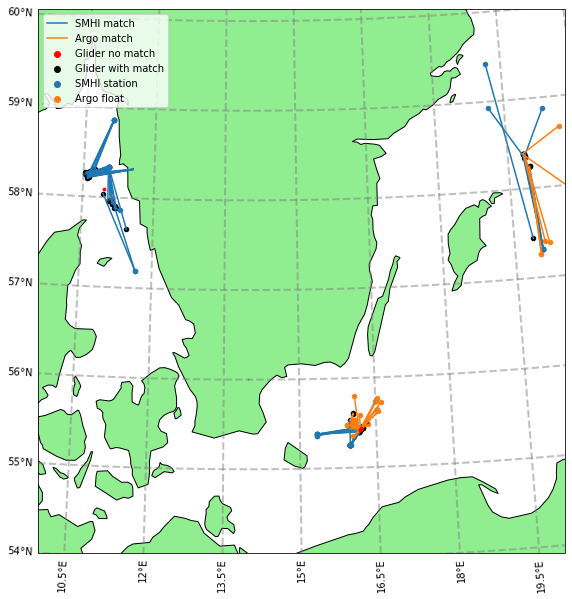

In [9]:
coord = cartopy.crs.AzimuthalEquidistant(central_longitude=14, central_latitude=56)
pc = cartopy.crs.PlateCarree()
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection=coord)
ax.set_extent([10, 20, 54, 60], crs=pc)

feature = cartopy.feature.NaturalEarthFeature(name='land', category='physical',
                                              scale='50m', edgecolor='black', facecolor='lightgreen')
ax.add_feature(feature)
gl = ax.gridlines(draw_labels=True,
                  linewidth=2, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = None
gl.right_labels = None

for name, df_smhi in smhi_datasets.items():
    ds_glider = glider_datasets[name]
    if df_smhi is not None:
        lon = [df_smhi['sample_longitude_dd'].values[0], np.nanmean(ds_glider.longitude)]
        lat = [df_smhi['sample_latitude_dd'].values[0], np.nanmean(ds_glider.latitude)]
        ax.plot(lon, lat, transform=pc, color="C0")
        ax.scatter(np.nanmean(ds_glider.longitude), np.nanmean(ds_glider.latitude), transform=pc, color="k", s=20)
        ax.scatter(df_smhi['sample_longitude_dd'].values[0], df_smhi['sample_latitude_dd'].values[0],transform=pc, color="C0", s=20)
    
        
for name, ds_argo in argo_datasets.items():
    ds_glider = glider_datasets[name]
    if ds_argo:
        lon = [ds_argo.LONGITUDE, np.nanmean(ds_glider.longitude)]
        lat = [ds_argo.LATITUDE, np.nanmean(ds_glider.latitude)]
        ax.plot(lon, lat, transform=pc, color="C1")
        ax.scatter(np.nanmean(ds_glider.longitude), np.nanmean(ds_glider.latitude), transform=pc, color="k", s=20)
        ax.scatter(ds_argo.LONGITUDE,ds_argo.LATITUDE,transform=pc, color="C1", s=20)
    

dataset_ids_no_match = dataset_match_df[~dataset_match_df.any_match].index

for name in dataset_ids_no_match:
    ds_glider = glider_datasets[name]
    ax.scatter(np.nanmean(ds_glider.longitude), np.nanmean(ds_glider.latitude),transform=pc, s=8, color="red", zorder=10)    

ax.plot((0,1), (0,1),color="C0", label="SMHI match")       
ax.plot((0,1), (0,1),color="C1", label="Argo match")

ax.scatter((0,1), (0,1),color="red", label="Glider no match")
ax.scatter((0,1), (0,1),color="k", label="Glider with match")
ax.scatter((0,1), (0,1),color="C0", label="SMHI station")
ax.scatter((0,1), (0,1),color="C1", label="Argo float")

ax.legend()
fig.savefig(f"figures/match_map.png")


### 4. Create comparative scatters

**Check dissolved oxygen conversion**

In [10]:
def oxy_ml_per_l_to_umol_per_m3(oxy_ml_l):
    """
    Old: 10mL dissolved O2 /L is about 13.3 mg/l http://rainbow.ldeo.columbia.edu/dl/QA/43.html
    New: mL L = mg L * (1 mL / 1.42903 mg) https://ogsl.ca/wp-content/uploads/Unit_conversions_en_0.pdf
    molar mass oxygen 15.9994 g/mol https://www.convertunits.com/molarmass/Oxygen
    """
    oxy_mg_l = oxy_ml_l * 1.42903 # or should it be 1.429?
    oxy_mmol_l = oxy_mg_l  / (15.9994 * 2)
    oxy_umol_l = oxy_mmol_l * 1e3
    oxy_umol_m3 = oxy_umol_l # * 1e3
    return oxy_umol_m3
oxy_ml_per_l_to_umol_per_m3 = np.vectorize(oxy_ml_per_l_to_umol_per_m3)


/tmp/ipykernel_133609/1404976617.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,3, sharey="row", figsize=(12, 9))


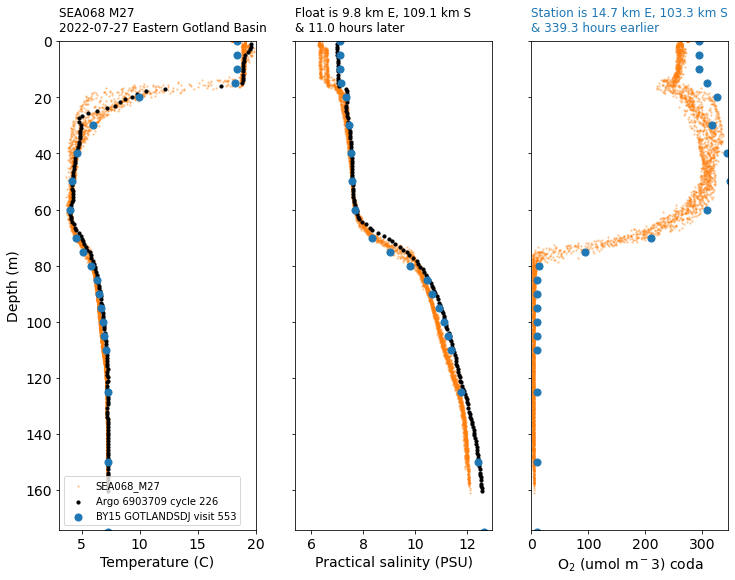

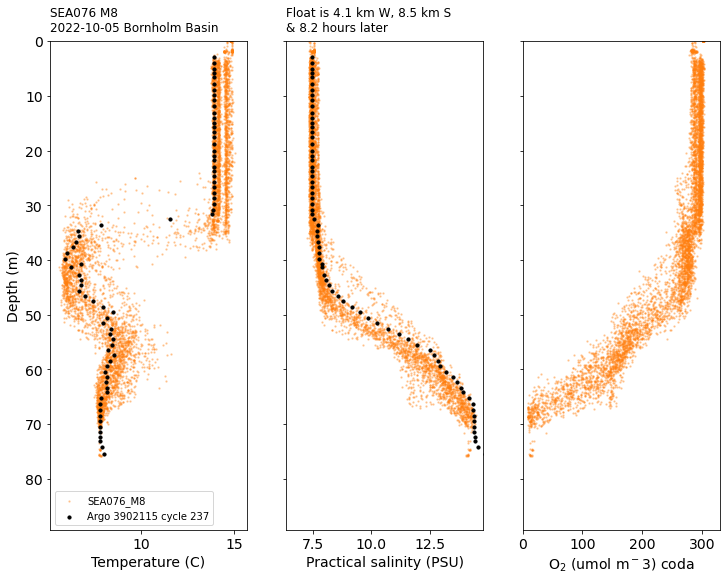

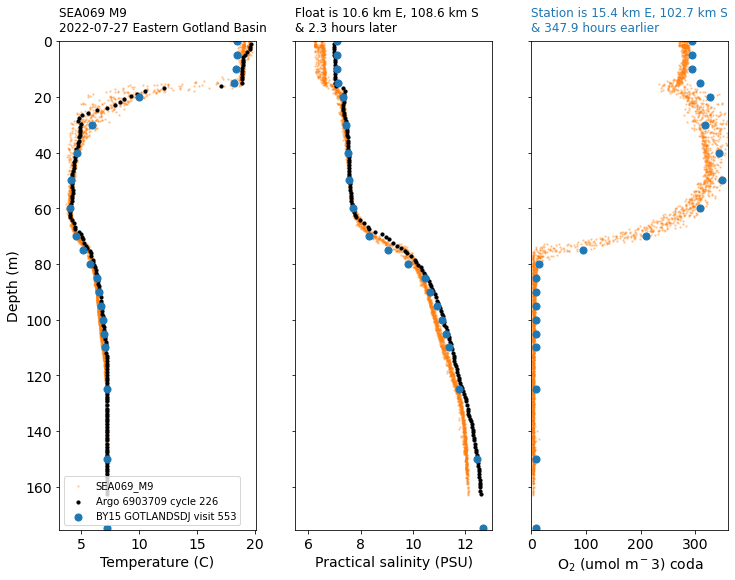

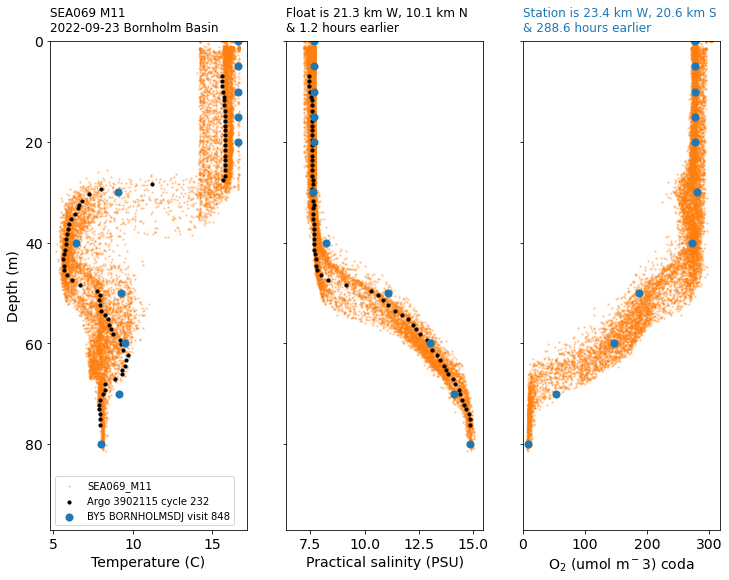

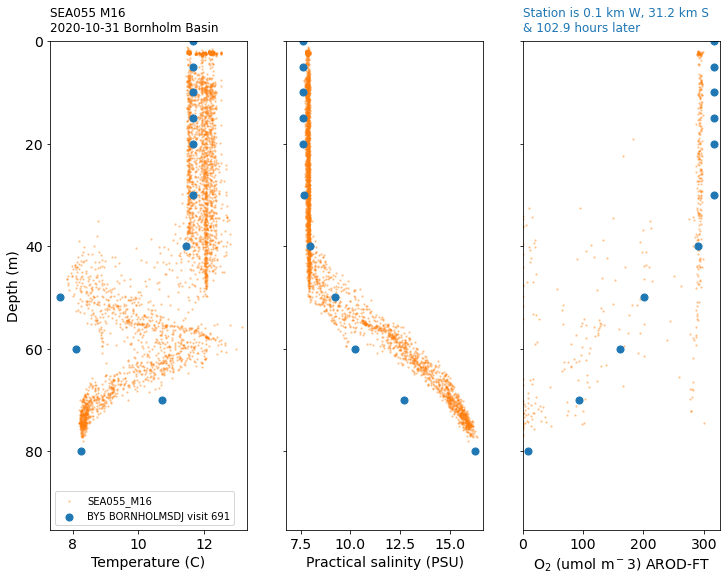

...

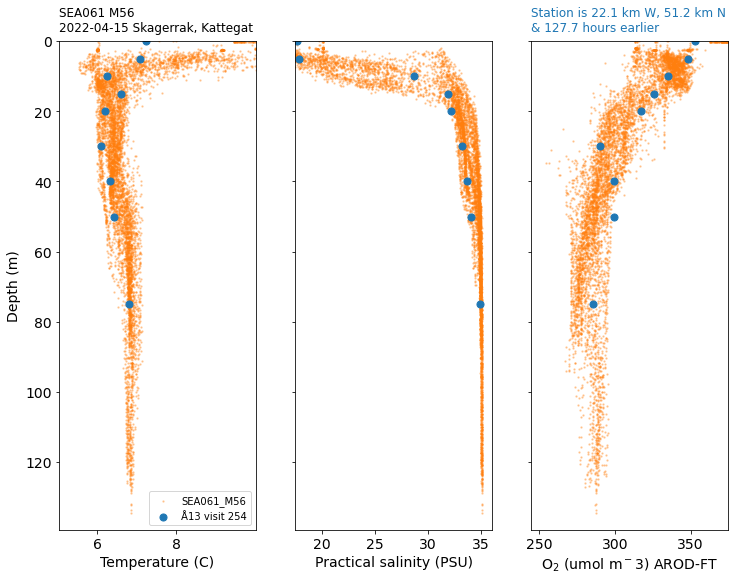

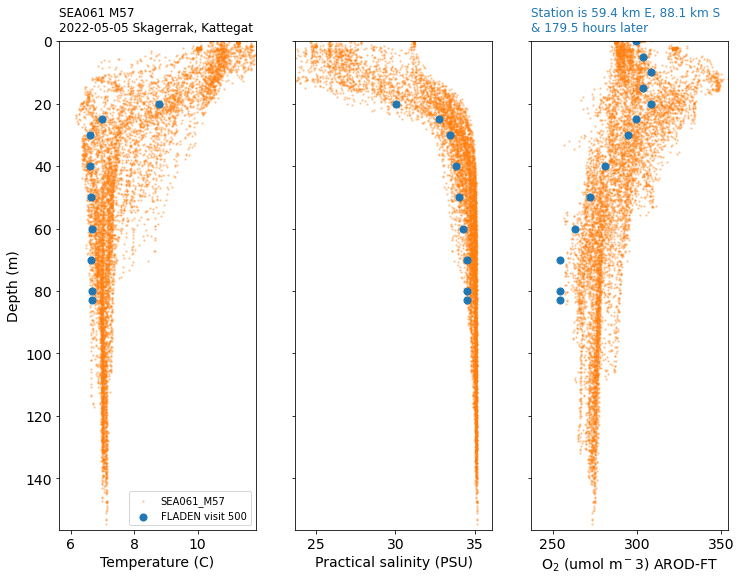

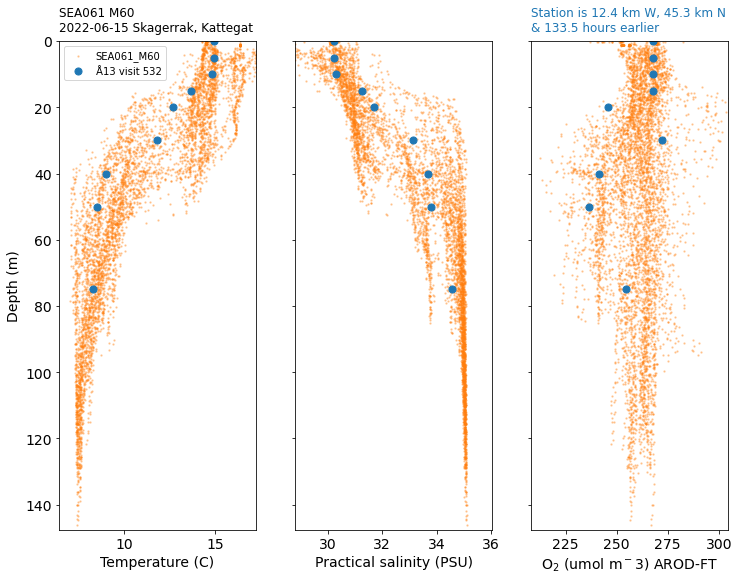

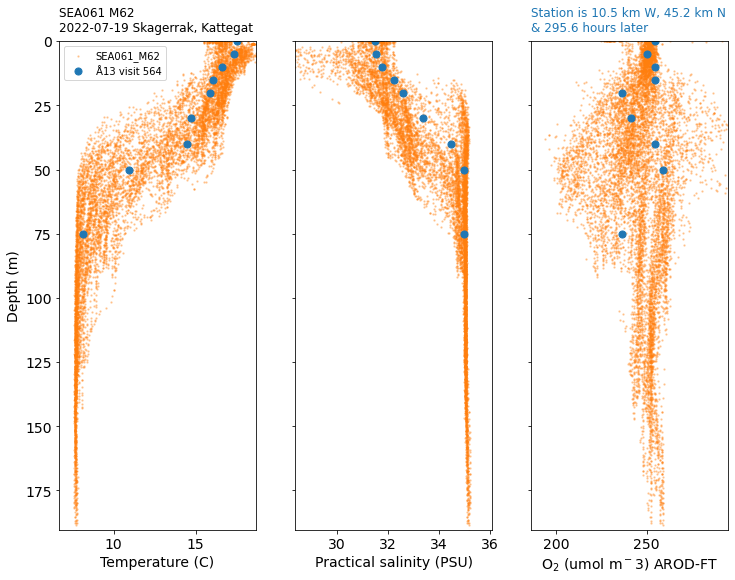

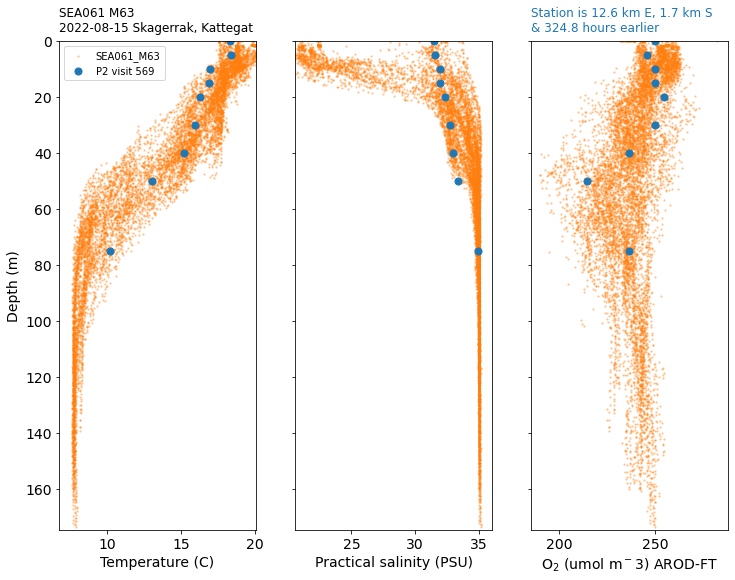

In [11]:
plt.rcParams.update({'font.size': 14})
def compare_scatter(name, ds_glider, ds_argo, df_smhi, span=50):
    """
    Create scatter plots of temperature salinity and dissolved oxygen to visually compare glider and SMHI station data
    """
    glider_kwargs = {"s": 2, "c": "C1", "alpha": 0.3}
    argo_kwargs = {"s": 10, "c": "k"}
    smhi_kwargs = {"s": 50, "c": "C0"}
    fig, ax = plt.subplots(1,3, sharey="row", figsize=(12, 9))
    ax = ax.ravel()
    ylim = [0, np.nanpercentile(ds_glider.depth[ds_glider.depth<1000], 99)+20]
    temp_lim = [np.nanpercentile(ds_glider.temperature,5)-1, np.nanpercentile(ds_glider.temperature,95)+1]
    ax[0].scatter(ds_glider.temperature, ds_glider.depth, label=name[4:], **glider_kwargs)    
    ax[0].set(ylabel="Depth (m)", xlabel="Temperature (C)", xlim=temp_lim, ylim=ylim)
 
    sal_lim = [np.nanpercentile(ds_glider.salinity,5)-1, np.nanpercentile(ds_glider.salinity,95)+1]
    ax[1].scatter(ds_glider.salinity, ds_glider.depth, **glider_kwargs)
    ax[1].set(xlabel="Practical salinity (PSU)", xlim=sal_lim)    
    
    oxy_lim = [np.nanpercentile(ds_glider.oxygen_concentration,5)-30, np.nanpercentile(ds_glider.oxygen_concentration,95)+30]
    if oxy_lim[0] < 100:
        oxy_lim[0] = 0
    ax[2].scatter(ds_glider.oxygen_concentration, ds_glider.depth,**glider_kwargs)
    ax[2].set(xlabel=f'O$_2$ (umol m$^{-3}$) {ast.literal_eval(ds_glider.attrs["oxygen"])["model"]}', xlim=oxy_lim, ylim=ylim)
    

    if ds_argo is not None:
        argo_name = f"Argo {int(ds_argo.PLATFORM_NUMBER)} cycle {int(ds_argo.CYCLE_NUMBER)}"
        ds_argo["DEPTH"] = -gsw.conversions.z_from_p(ds_argo.PRES, ds_argo.LATITUDE.values)
        ax[0].scatter(ds_argo.TEMP, ds_argo.DEPTH, **argo_kwargs, label=argo_name)
        ax[1].scatter(ds_argo.PSAL, ds_argo.DEPTH, **argo_kwargs)

        deg_n = ds_argo.LATITUDE.values - np.nanmean(ds_glider.latitude)
        deg_e = ds_argo.LONGITUDE.values - np.nanmean(ds_glider.longitude)
        ns_ahead = ds_argo.TIME.values - ds_glider.time.mean()
        east_diff, north_diff, time_diff = utils.format_difference(deg_e, deg_n, ns_ahead)
        loc_str = f"Float is {east_diff}, {north_diff}\n& {time_diff}"
        loc_str
        ax[1].text(0, 1.02, loc_str, fontsize=12, transform=ax[1].transAxes)
        
        
    if df_smhi is not None:
        smhi_name = f"{df_smhi['station_name'].values[0]} visit {df_smhi['visit_id'].values[0]}"
        df_temp = df_smhi[df_smhi['parameter']=="Temperature CTD"]
        df_sal = df_smhi[df_smhi['parameter']=="Salinity CTD"]    
        df_oxy = df_smhi[df_smhi['parameter']=="Dissolved oxygen O2 CTD"]    
        ax[0].scatter(df_temp["value"], df_temp['sample_depth_m'], **smhi_kwargs, label=smhi_name)
        ax[1].scatter(df_sal["value"], df_sal['sample_depth_m'], **smhi_kwargs)
        ax[2].scatter(oxy_ml_per_l_to_umol_per_m3(df_oxy["value"].astype(float)), df_oxy['sample_depth_m'], **smhi_kwargs)
        deg_e = df_smhi['sample_longitude_dd'].values[0] - np.nanmean(ds_glider.longitude)
        deg_n = df_smhi['sample_latitude_dd'].values[0] - np.nanmean(ds_glider.latitude)
        time_diff = df_smhi['visit_date'].values[0] - ds_glider.time.mean()
        east_diff, north_diff, time_diff = utils.format_difference(deg_e, deg_n, time_diff)
        loc_str = f"Station is {east_diff}, {north_diff}\n& {time_diff}"
        ax[2].text(0, 1.02, loc_str, fontsize=12, transform=ax[2].transAxes, color="C0")
        
    # final touches
    attrs = ds_glider.attrs
    glider_str = f'SEA0{attrs["glider_serial"]} M{attrs["deployment_id"]}\n{attrs["deployment_start"][:10]} {attrs["basin"]}'
    ax[0].text(0, 1.02, glider_str, fontsize=12, transform=ax[0].transAxes)
    ax[0].invert_yaxis()
    ax[0].legend(fontsize=10)
    
    
    plt.savefig(f"figures/compare_{name}.png")
    #plt.close("all")

for name in dataset_match_df.index:
    compare_scatter(name, glider_datasets[name], argo_datasets[name], smhi_datasets[name])